
1. Spend **1 min** on project flow structure.
    Which steps does your project have?
2. Spend **1 min** on showing insights and relationships you found in the data during exploratory data analysis.
3. Results (**1 min**):
    - what modeling and sampling techniques did you use?
    - evaluation metrics
4. **1 min** on Feature Importance
    - mention interesting features you have created
    - what are the most important features?
5. Explain the biggest challenges in **1 min**.
    - what would you do if you have a bit more time?


---

In [1]:
%matplotlib inline
from modules.images import display
from modules.Baseline import baseline_results
from modules.finalmodel import final_results

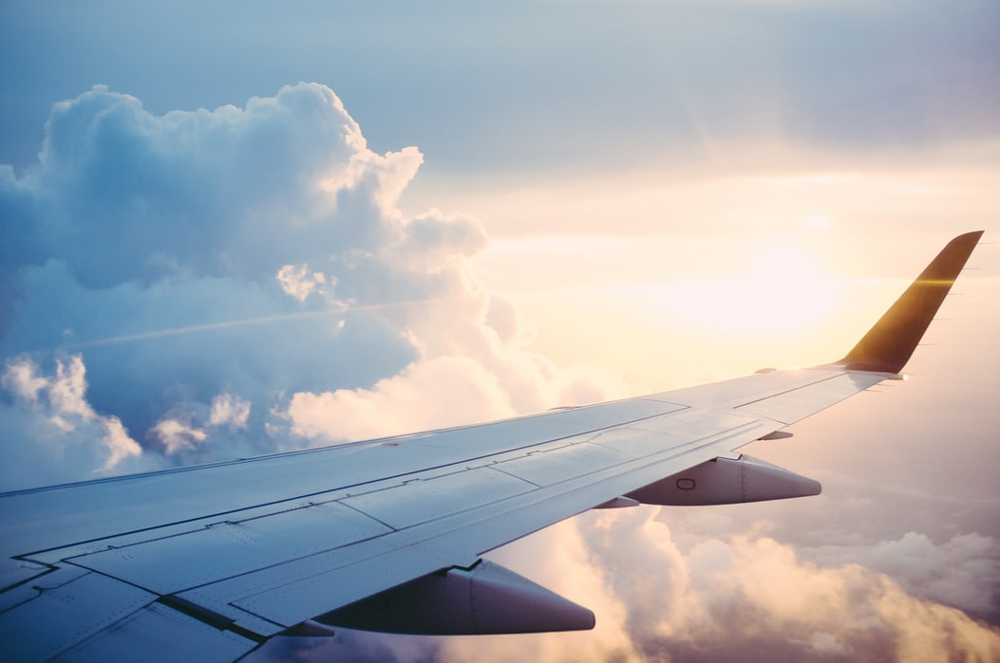

In [2]:
display('plane')

# 1 : Project flow structure. Which steps does your project have?

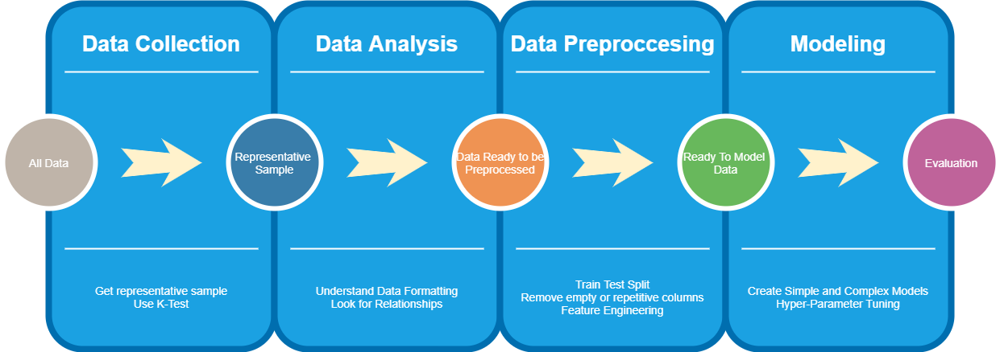

In [3]:
display('workflow')

- Downloaded all the data in peices
- Needed to reduce the amount of rows to a workable amount
    - Random sample can still have bias
    - Randomly sampled 100,000 rows of data
    - Then performed a Kolmogorov–Smirnov test, against each columnm,to make sure the sample data is representative of the entire data

In [4]:
from modules.k_test import different_distributions

In [5]:
different_distributions()

---
# 2: exploratory data analysis

## EDA - Hypothesis

- The delays are normally distributed
- Planes fly faster when there is a departure delay
- The following features are correlated with arrival delays:
    - Time of day (Hour)
    - Time of year (Month)
    - Airport Traffic (Hourly)
    - Location
    - Departure Delay

### Delays are normally distributed

In [6]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, plotly.express as px
from scipy.stats import kstest
from modules.make_datetime import make_datetime
pd.options.display.max_columns = 1000

In [7]:
flights_sample = pd.read_csv('../Data Exploration/samples/flights_sample.csv', sep=';', low_memory=False).drop(labels=['Unnamed: 0', 'Unnamed: 0.1'], axis=1)

In [8]:
fig1 = px.histogram(flights_sample['arr_delay'].dropna(), 
                    nbins=1000, 
                    range_x=(-100, 200),
                    labels={'value': 'Arrival Delay (min)'},
                    title='Histogram of Arrival Delays - Positively Skewed Distribution')

In [9]:
fig1.show()

#### The distribution is positivley skewed. As such, median and mode will be better predictors than mean

#### The distribution is positivley skewed. As such, median and mode will be better predictors than mean

In [10]:
from scipy.stats import kstest
kstest(flights_sample['arr_delay'].dropna(), 'norm')

KstestResult(statistic=0.5845697269166206, pvalue=0.0)

In [11]:
distribution_dict = {'Mean of Delays': flights_sample['arr_delay'].mean(),
                     'Median of Delays': flights_sample['arr_delay'].median(),
                     'Mode of Delays': flights_sample['arr_delay'].mode()}

In [12]:
pd.DataFrame(distribution_dict)

,Mean of Delays,Median of Delays,Mode of Delays
0,5.557749,-6.0,-8.0


### Planes fly faster when there is a departure delay

In [13]:
flights_durations = flights_sample[['dep_delay', 'distance', 'air_time']].dropna()
flights_durations['avg_speed'] = (flights_durations['distance'] / flights_durations['air_time']) * 60
flights_durations

,dep_delay,distance,air_time,avg_speed
0,12.0,986,149.0,397.046980
1,-3.0,361,56.0,386.785714
2,3.0,592,98.0,362.448980
3,0.0,1235,170.0,435.882353
4,3.0,1721,226.0,456.902655
...,...,...,...,...
99990,10.0,581,86.0,405.348837
99992,77.0,1024,128.0,480.000000
99993,54.0,325,56.0,348.214286
99994,2.0,392,68.0,345.882353


In [14]:
fig2 = px.scatter(x=flights_durations['dep_delay'],
                  y=flights_durations['avg_speed'],
                  labels={'x': 'Departure Delay (min)',
                          'y': 'Avg Velocity (Km/Hr)'},
                  range_x=(-40, 600),
                  title='Departure Delay vs Avg Flight Speed')

In [15]:
fig2.show()

#### It is clear that the average flight speed has no correlation with departure delay.

### Time

In [16]:
flights_sample = make_datetime(flights_sample)

Converting fl_date...
Formatting crs_dep_time for datetime object conversion...
Formatting crs_arr_time for datetime object conversion...
Complete! Converted df returned.


In [17]:
flights_sample_avg_monthly_delay = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).mean()['arr_delay']
flights_sample_med_monthly_delay = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).median()['arr_delay']
flights_sample_monthly_flights = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).sum()['flights']

In [18]:
flights_sample_avg_hourly_dep_delay = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).mean()['arr_delay']
flights_sample_med_hourly_dep_delay = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).median()['arr_delay']
flights_sample_hourly_dep_flights = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).sum()['flights']

In [19]:
flights_sample_avg_hourly_arr_delay = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).mean()['arr_delay']
flights_sample_med_hourly_arr_delay = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).median()['arr_delay']
flights_sample_hourly_arr_flights = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).sum()['flights']

In [20]:
fig3 = px.bar(x=flights_sample_avg_monthly_delay.index, 
              y=flights_sample_avg_monthly_delay.values,
             labels={'x': 'Month',
                    'y': 'Average Arrival Delay (min)'},
             title='Monthly Average Arrival Delays')

In [21]:
fig3.show()

In [22]:
fig4 = px.bar(x=flights_sample_med_monthly_delay.index, 
              y=flights_sample_med_monthly_delay.values,
             labels={'x': 'Month',
                    'y': 'Median Arrival Delay (min)'},
             title='Monthly Median Arrival Delays By Departure Times',
             width=1000,
             height=400)

In [23]:
fig4.show()

In [24]:
fig5 = px.bar(x=flights_sample_monthly_flights.index, 
              y=flights_sample_monthly_flights.values,
             labels={'x': 'Month',
                    'y': 'Total Flights'},
             title='Monthly Flights',
             width=1000,
             height=400)

In [25]:
fig5.show()

In [26]:
fig6 = px.bar(x=flights_sample_avg_hourly_dep_delay.index, 
              y=flights_sample_avg_hourly_dep_delay.values,
             labels={'x': 'Departure Hour',
                    'y': 'Avg Arrival Delay (min)'},
             title='Avg Hourly Arrival Delay By Departure Time')

In [27]:
fig6.show()

In [28]:
fig7 = px.bar(x=flights_sample_med_hourly_dep_delay.index, 
              y=flights_sample_med_hourly_dep_delay.values,
             labels={'x': 'Departure Hour',
                    'y': 'Median Arrival Delay (min)'},
             title='Median Hourly Arrival Delay By Departure Time',
             width=1000,
             height=400)

In [29]:
fig7.show()

In [30]:
fig8 = px.bar(x=flights_sample_hourly_dep_flights.index, 
              y=flights_sample_hourly_dep_flights.values,
             labels={'x': 'Departure Hour',
                    'y': 'Total Flights'},
             title='Total Departing Flights By Hour',
             width=1000,
             height=400)

In [31]:
fig8.show()

In [32]:
fig9 = px.bar(x=flights_sample_avg_hourly_arr_delay.index, 
              y=flights_sample_avg_hourly_arr_delay.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Avg Arrival Delay (min)'},
             title='Avg Hourly Arrival Delay By Arrival Time')

In [33]:
fig9.show()

In [34]:
fig10 = px.bar(x=flights_sample_med_hourly_arr_delay.index, 
              y=flights_sample_med_hourly_arr_delay.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Median Arrival Delay (min)'},
             title='Median Hourly Arrival Delay By Arrival Time',
             width=1000,
             height=400)

In [35]:
fig10.show()

In [36]:
fig11 = px.bar(x=flights_sample_hourly_arr_flights.index, 
              y=flights_sample_hourly_arr_flights.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Total Flights'},
             title='Total Arriving Flights By Hour',
             width=1000,
             height=400)

In [37]:
fig11.show()

#### There exists a causation between time of day and arrival delays
#### There exists a causation between month and arrival delays
#### There exists a correlation between number of flights(traffic) and arrival delays

In [38]:
state_hourly_med_arr = pd.read_csv('../Feature Engineering/delay idx tables/state_arr_median_hourly_delays.csv', sep=';', index_col=0)
state_hourly_med_dep = pd.read_csv('../Feature Engineering/delay idx tables/state_dep_median_hourly_delays.csv', sep=';', index_col=0)
state_monthly_med_arr = pd.read_csv('../Feature Engineering/delay idx tables/state_arr_median_monthly_delays.csv', sep=';', index_col=0)
state_monthly_med_dep = pd.read_csv('../Feature Engineering/delay idx tables/state_dep_median_monthly_delays.csv', sep=';', index_col=0)

FileNotFoundError: [Errno 2] File ../Feature Engineering/delay idx tables/state_arr_median_hourly_delays.csv does not exist: '../Feature Engineering/delay idx tables/state_arr_median_hourly_delays.csv'

In [ ]:
state_hourly_med_arr

In [ ]:
state_daily_avg_med_arr = state_hourly_med_arr.groupby(by='Destination State').mean().sort_values(by='Hourly Arrival Delay(Median)')
state_daily_avg_med_dep = state_hourly_med_dep.groupby(by='Origin State').mean()
state_yearly_avg_med_arr = state_monthly_med_arr.groupby(by='Destination State').mean()
state_yearly_avg_med_dep = state_monthly_med_dep.groupby(by='Origin State').mean()

In [ ]:
state_daily_avg_med_dep = state_daily_avg_med_dep.reindex(index=state_daily_avg_med_arr.index)
state_yearly_avg_med_arr = state_yearly_avg_med_arr.reindex(index=state_daily_avg_med_arr.index)
state_yearly_avg_med_dep = state_yearly_avg_med_dep.reindex(index=state_daily_avg_med_arr.index)

In [ ]:
fig12 = px.bar(x=state_daily_avg_med_arr.index,
               y=state_daily_avg_med_arr['Hourly Arrival Delay(Median)'],
              labels={'x': 'Destination State',
                     'y': 'Avg Daily Median Delay (min)'},
              title='Daily Median Arrival Delay By Destination State',
              width=1000,
              height=400)

In [ ]:
fig12.show()
fig13.show()

In [ ]:
fig13 = px.bar(x=state_daily_avg_med_dep.index,
               y=state_daily_avg_med_dep['Hourly Arrival Delay(Median)'],
              labels={'x': 'Origin State',
                     'y': 'Avg Daily Median Delay (min)'},
              title='Daily Median Arrival Delay By Arrival State',
              width=1000,
              height=400)

In [ ]:
fig13.show()

In [ ]:
fig14 = px.bar(x=state_yearly_avg_med_arr.index,
               y=state_yearly_avg_med_arr['Monthly Arrival Delay(Median)'],
              labels={'x': 'Destination State',
                     'y': 'Avg Annual Median Delay (min)'},
              title='Average Annual Median Arrival Delay By Destination State',
              width=1000,
              height=400)

In [ ]:
fig14.show()
fig15.show()

In [ ]:
fig15 = px.bar(x=state_yearly_avg_med_dep.index,
               y=state_yearly_avg_med_dep['Monthly Arrival Delay(Median)'],
              labels={'x': 'Origin State',
                     'y': 'Avg Annual Median Delay (min)'},
              title='Average Annual Median Arrival Delay By Origin State',
              width=1000,
              height=400)

In [ ]:
fig15.show()

In [ ]:
total_dep_flights_state = flights_sample.groupby(by=[flights_sample['origin_city_name']]).count()#['flights']
total_arr_flights_state = flights_sample.groupby(by=[flights_sample['dest_city_name']]).count()#['flights']

total_dep_flights_state.reset_index(inplace=True)
total_arr_flights_state.reset_index(inplace=True)

In [ ]:
for i in range(len(total_dep_flights_state)):
    total_dep_flights_state['origin_city_name'][i] = total_dep_flights_state['origin_city_name'][i][-2:]

In [ ]:
for i in range(len(total_arr_flights_state)):
    total_arr_flights_state['dest_city_name'][i] = total_arr_flights_state['dest_city_name'][i][-2:]

In [ ]:
total_dep_flights_state = total_dep_flights_state.groupby(by='origin_city_name').sum()['flights']

In [ ]:
total_dep_flights_state = total_dep_flights_state.reindex(index=state_yearly_avg_med_arr.index)

In [ ]:
total_arr_flights_state = total_arr_flights_state.groupby(by='dest_city_name').sum()['flights']

In [ ]:
total_arr_flights_state = total_arr_flights_state.sort_values()

In [ ]:
len(total_arr_flights_state)

In [ ]:
total_dep_flights_state = total_dep_flights_state.reindex(index=state_daily_avg_med_arr.index)
total_arr_flights_state = total_arr_flights_state.reindex(index=state_daily_avg_med_arr.index)

In [ ]:
fig16 = px.bar(x=total_dep_flights_state.index,
               y=total_dep_flights_state.values,
              labels={'x': 'Origin State',
                     'y': 'Total Flights'},
              title='Total Departing Flights by State',
              width=1000,
              height=400)

In [ ]:
fig16.show()
fig17.show()

In [ ]:
fig17 = px.bar(x=total_arr_flights_state.index,
               y=total_arr_flights_state.values,
              labels={'x': 'Destination State',
                     'y': 'Total Flights'},
              title='Total Arriving Flights by State',
              width=1000,
              height=400)

In [ ]:
fig17.show()

#### Each state has its own unique relationship with arrival delays
- generating columns that identify the state, should be effective

### Departure Delay

In [ ]:
fig18 = px.scatter(x=flights_sample['dep_delay'],
                  y=flights_sample['arr_delay'],
                  labels={'x': 'Departure Delay (min)',
                         'y': 'Arrival Delay'},
                  title='Departure Delay vs Arrival Delay')

In [ ]:
fig18.show()

#### There is an extremely high correlation between departure and arrival delays

## EDA - Hypothesis

- The delays are normally distributed
- Planes fly faster when there is a departure delay
- The following features are correlated with arrival delays:
    - Time of day (Hour)
    - Time of year (Month)
    - Airport Traffic (Hourly)
    - Location
    - Departure Delay

### Delays are normally distributed

In [ ]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, plotly.express as px
from scipy.stats import kstest
from modules.make_datetime import make_datetime
pd.options.display.max_columns = 1000

In [ ]:
flights_sample = pd.read_csv('../Data Exploration/samples/flights_sample.csv', sep=';', low_memory=False).drop(labels=['Unnamed: 0', 'Unnamed: 0.1'], axis=1)

In [ ]:
fig1 = px.histogram(flights_sample['arr_delay'].dropna(), 
                    nbins=1000, 
                    range_x=(-100, 200),
                    labels={'value': 'Arrival Delay (min)'},
                    title='Histogram of Arrival Delays - Positively Skewed Distribution')

In [ ]:
fig1.show()

#### The distribution is positivley skewed. As such, median and mode will be better predictors than mean

#### The distribution is positivley skewed. As such, median and mode will be better predictors than mean

In [ ]:
from scipy.stats import kstest
kstest(flights_sample['arr_delay'].dropna(), 'norm')

In [ ]:
distribution_dict = {'Mean of Delays': flights_sample['arr_delay'].mean(),
                     'Median of Delays': flights_sample['arr_delay'].median(),
                     'Mode of Delays': flights_sample['arr_delay'].mode()}

In [ ]:
pd.DataFrame(distribution_dict)

### Planes fly faster when there is a departure delay

In [ ]:
flights_durations = flights_sample[['dep_delay', 'distance', 'air_time']].dropna()
flights_durations['avg_speed'] = (flights_durations['distance'] / flights_durations['air_time']) * 60
flights_durations

In [ ]:
fig2 = px.scatter(x=flights_durations['dep_delay'],
                  y=flights_durations['avg_speed'],
                  labels={'x': 'Departure Delay (min)',
                          'y': 'Avg Velocity (Km/Hr)'},
                  range_x=(-40, 600),
                  title='Departure Delay vs Avg Flight Speed')

In [ ]:
fig2.show()

#### It is clear that the average flight speed has no correlation with departure delay.

### Time

In [ ]:
flights_sample = make_datetime(flights_sample)

In [ ]:
flights_sample_avg_monthly_delay = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).mean()['arr_delay']
flights_sample_med_monthly_delay = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).median()['arr_delay']
flights_sample_monthly_flights = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).sum()['flights']

In [ ]:
flights_sample_avg_hourly_dep_delay = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).mean()['arr_delay']
flights_sample_med_hourly_dep_delay = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).median()['arr_delay']
flights_sample_hourly_dep_flights = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).sum()['flights']

In [ ]:
flights_sample_avg_hourly_arr_delay = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).mean()['arr_delay']
flights_sample_med_hourly_arr_delay = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).median()['arr_delay']
flights_sample_hourly_arr_flights = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).sum()['flights']

In [ ]:
fig3 = px.bar(x=flights_sample_avg_monthly_delay.index, 
              y=flights_sample_avg_monthly_delay.values,
             labels={'x': 'Month',
                    'y': 'Average Arrival Delay (min)'},
             title='Monthly Average Arrival Delays')

In [ ]:
fig3.show()

In [ ]:
fig4 = px.bar(x=flights_sample_med_monthly_delay.index, 
              y=flights_sample_med_monthly_delay.values,
             labels={'x': 'Month',
                    'y': 'Median Arrival Delay (min)'},
             title='Monthly Median Arrival Delays By Departure Times',
             width=1000,
             height=400)

In [ ]:
fig4.show()

In [ ]:
fig5 = px.bar(x=flights_sample_monthly_flights.index, 
              y=flights_sample_monthly_flights.values,
             labels={'x': 'Month',
                    'y': 'Total Flights'},
             title='Monthly Flights',
             width=1000,
             height=400)

In [ ]:
fig5.show()

In [ ]:
fig6 = px.bar(x=flights_sample_avg_hourly_dep_delay.index, 
              y=flights_sample_avg_hourly_dep_delay.values,
             labels={'x': 'Departure Hour',
                    'y': 'Avg Arrival Delay (min)'},
             title='Avg Hourly Arrival Delay By Departure Time')

In [ ]:
fig6.show()

In [ ]:
fig7 = px.bar(x=flights_sample_med_hourly_dep_delay.index, 
              y=flights_sample_med_hourly_dep_delay.values,
             labels={'x': 'Departure Hour',
                    'y': 'Median Arrival Delay (min)'},
             title='Median Hourly Arrival Delay By Departure Time',
             width=1000,
             height=400)

In [ ]:
fig7.show()

In [ ]:
fig8 = px.bar(x=flights_sample_hourly_dep_flights.index, 
              y=flights_sample_hourly_dep_flights.values,
             labels={'x': 'Departure Hour',
                    'y': 'Total Flights'},
             title='Total Departing Flights By Hour',
             width=1000,
             height=400)

In [ ]:
fig8.show()

In [ ]:
fig9 = px.bar(x=flights_sample_avg_hourly_arr_delay.index, 
              y=flights_sample_avg_hourly_arr_delay.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Avg Arrival Delay (min)'},
             title='Avg Hourly Arrival Delay By Arrival Time')

In [ ]:
fig9.show()

In [ ]:
fig10 = px.bar(x=flights_sample_med_hourly_arr_delay.index, 
              y=flights_sample_med_hourly_arr_delay.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Median Arrival Delay (min)'},
             title='Median Hourly Arrival Delay By Arrival Time',
             width=1000,
             height=400)

In [ ]:
fig10.show()

In [ ]:
fig11 = px.bar(x=flights_sample_hourly_arr_flights.index, 
              y=flights_sample_hourly_arr_flights.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Total Flights'},
             title='Total Arriving Flights By Hour',
             width=1000,
             height=400)

In [ ]:
fig11.show()

#### There exists a causation between time of day and arrival delays
#### There exists a causation between month and arrival delays
#### There exists a correlation between number of flights(traffic) and arrival delays

In [ ]:
state_hourly_med_arr = pd.read_csv('../Feature Engineering/delay idx tables/state_arr_median_hourly_delays.csv', sep=';', index_col=0)
state_hourly_med_dep = pd.read_csv('../Feature Engineering/delay idx tables/state_dep_median_hourly_delays.csv', sep=';', index_col=0)
state_monthly_med_arr = pd.read_csv('../Feature Engineering/delay idx tables/state_arr_median_monthly_delays.csv', sep=';', index_col=0)
state_monthly_med_dep = pd.read_csv('../Feature Engineering/delay idx tables/state_dep_median_monthly_delays.csv', sep=';', index_col=0)

In [ ]:
state_hourly_med_arr

In [ ]:
state_daily_avg_med_arr = state_hourly_med_arr.groupby(by='Destination State').mean().sort_values(by='Hourly Arrival Delay(Median)')
state_daily_avg_med_dep = state_hourly_med_dep.groupby(by='Origin State').mean()
state_yearly_avg_med_arr = state_monthly_med_arr.groupby(by='Destination State').mean()
state_yearly_avg_med_dep = state_monthly_med_dep.groupby(by='Origin State').mean()

In [ ]:
state_daily_avg_med_dep = state_daily_avg_med_dep.reindex(index=state_daily_avg_med_arr.index)
state_yearly_avg_med_arr = state_yearly_avg_med_arr.reindex(index=state_daily_avg_med_arr.index)
state_yearly_avg_med_dep = state_yearly_avg_med_dep.reindex(index=state_daily_avg_med_arr.index)

In [ ]:
fig12 = px.bar(x=state_daily_avg_med_arr.index,
               y=state_daily_avg_med_arr['Hourly Arrival Delay(Median)'],
              labels={'x': 'Destination State',
                     'y': 'Avg Daily Median Delay (min)'},
              title='Daily Median Arrival Delay By Destination State',
              width=1000,
              height=400)

In [ ]:
fig12.show()
fig13.show()

In [ ]:
fig13 = px.bar(x=state_daily_avg_med_dep.index,
               y=state_daily_avg_med_dep['Hourly Arrival Delay(Median)'],
              labels={'x': 'Origin State',
                     'y': 'Avg Daily Median Delay (min)'},
              title='Daily Median Arrival Delay By Arrival State',
              width=1000,
              height=400)

In [ ]:
fig13.show()

In [ ]:
fig14 = px.bar(x=state_yearly_avg_med_arr.index,
               y=state_yearly_avg_med_arr['Monthly Arrival Delay(Median)'],
              labels={'x': 'Destination State',
                     'y': 'Avg Annual Median Delay (min)'},
              title='Average Annual Median Arrival Delay By Destination State',
              width=1000,
              height=400)

In [ ]:
fig14.show()
fig15.show()

In [ ]:
fig15 = px.bar(x=state_yearly_avg_med_dep.index,
               y=state_yearly_avg_med_dep['Monthly Arrival Delay(Median)'],
              labels={'x': 'Origin State',
                     'y': 'Avg Annual Median Delay (min)'},
              title='Average Annual Median Arrival Delay By Origin State',
              width=1000,
              height=400)

In [ ]:
fig15.show()

In [ ]:
total_dep_flights_state = flights_sample.groupby(by=[flights_sample['origin_city_name']]).count()#['flights']
total_arr_flights_state = flights_sample.groupby(by=[flights_sample['dest_city_name']]).count()#['flights']

total_dep_flights_state.reset_index(inplace=True)
total_arr_flights_state.reset_index(inplace=True)

In [ ]:
for i in range(len(total_dep_flights_state)):
    total_dep_flights_state['origin_city_name'][i] = total_dep_flights_state['origin_city_name'][i][-2:]

In [ ]:
for i in range(len(total_arr_flights_state)):
    total_arr_flights_state['dest_city_name'][i] = total_arr_flights_state['dest_city_name'][i][-2:]

In [ ]:
total_dep_flights_state = total_dep_flights_state.groupby(by='origin_city_name').sum()['flights']

In [ ]:
total_dep_flights_state = total_dep_flights_state.reindex(index=state_yearly_avg_med_arr.index)

In [ ]:
total_arr_flights_state = total_arr_flights_state.groupby(by='dest_city_name').sum()['flights']

In [ ]:
total_arr_flights_state = total_arr_flights_state.sort_values()

In [ ]:
len(total_arr_flights_state)

In [ ]:
total_dep_flights_state = total_dep_flights_state.reindex(index=state_daily_avg_med_arr.index)
total_arr_flights_state = total_arr_flights_state.reindex(index=state_daily_avg_med_arr.index)

In [ ]:
fig16 = px.bar(x=total_dep_flights_state.index,
               y=total_dep_flights_state.values,
              labels={'x': 'Origin State',
                     'y': 'Total Flights'},
              title='Total Departing Flights by State',
              width=1000,
              height=400)

In [ ]:
fig16.show()
fig17.show()

In [ ]:
fig17 = px.bar(x=total_arr_flights_state.index,
               y=total_arr_flights_state.values,
              labels={'x': 'Destination State',
                     'y': 'Total Flights'},
              title='Total Arriving Flights by State',
              width=1000,
              height=400)

In [ ]:
fig17.show()

#### Each state has its own unique relationship with arrival delays
- generating columns that identify the state, should be effective

### Departure Delay

In [ ]:
fig18 = px.scatter(x=flights_sample['dep_delay'],
                  y=flights_sample['arr_delay'],
                  labels={'x': 'Departure Delay (min)',
                         'y': 'Arrival Delay'},
                  title='Departure Delay vs Arrival Delay')

In [ ]:
fig18.show()

#### There is an extremely high correlation between departure and arrival delays

---
# 3: Results (1 min):
- what modeling and sampling techniques did you use?
- evaluation metrics

In [ ]:
display('basic')

In [ ]:
baseline_results()

In [ ]:
display('complex')

In [ ]:
final_results()

----
# 4 1 min on Feature Importance
- mention interesting features you have created
- what are the most important features?


---
# 5
- Explain the biggest challenges in 1 min.
- what would you do if you have a bit more time?


### Challenges
1. Computer
1. Understand hyperparameters better
1. Understand feature engineering better

In [ ]:
display('challenges')